# Examine RadarSAT2 Archive for Grand Mesa

Last updated: 9/15/2019

In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.dates import YearLocator, MonthLocator, DateFormatter
from pandas.plotting import table
import matplotlib.dates as mdates

import holoviews as hv
import hvplot.xarray
import hvplot.pandas
import geoviews as gv

In [2]:
%matplotlib inline
#%qtconsole

In [3]:
pwd

'/home/jovyan/snowex/snowex2019'

In [4]:
#vectorFile = '/Users/scott/Documents/Research/Stereo2SWE/RS2/grandmesa-aoi.geojson'
vectorFile = 'grandmesa-aoi.geojson'

In [5]:
gf = gpd.read_file(vectorFile).drop(columns='id')

In [6]:
gf

,geometry
0,POLYGON ((-108.4539273954205 39.10387805164919...


In [7]:
type(gf)

geopandas.geodataframe.GeoDataFrame

In [17]:
# Plot search AOI and frames on a map using Holoviz Libraries
aoi = gf.hvplot(geo=True, line_color='b', fill_color=None)
#tiles = gv.tile_sources.CartoEco.options(width=700, height=500) 
tiles = gv.tile_sources.StamenTerrainRetina.options(width=700, height=500) 
labels = gv.tile_sources.StamenLabels.options(level='annotation')
tiles * aoi

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]

# Grand mesa
Name_GM2ER1_092aa-RS2.csv

In [32]:
#!ogr2ogr -of GeoJSON search_export_2019.geojson search_export_2019.kml Features -nlt POLYGON

# Doesn't work so well.
#import fiona
#fiona.drvsupport.supported_drivers['kml'] = 'rw' 
#fiona.drvsupport.supported_drivers['LIBKML'] = 'rw' 
#gf = gpd.read_file('/Users/scott/Documents/Research/Stereo2SWE/RS2/gm-rs2-search.kml')
#gf.head()

In [33]:
gf = gpd.read_file('search_export_2019.geojson')
gf.head()

,Name,description,tessellate,extrude,visibility,geometry
0,2019-08-27T01:14:34,\nGeoCenter Feature ID: 0b3f6198-ce50-4730-9e5...,-1,0,-1,POLYGON Z ((-109.6113668643893 39.642374428718...
1,2019-07-10T01:14:37,\nGeoCenter Feature ID: 31b92c3e-ee55-4a5b-ba5...,-1,0,-1,POLYGON Z ((-109.6116170002802 39.642512847859...
2,2019-05-23T01:14:40,\nGeoCenter Feature ID: e9db7ec0-5520-4cd1-919...,-1,0,-1,POLYGON Z ((-109.6103984104443 39.642867439849...
3,2019-02-16T01:14:43,\nGeoCenter Feature ID: de568899-1e9c-471e-9dd...,-1,0,-1,POLYGON Z ((-109.6125646483449 39.641167066684...
4,2018-11-12T01:14:54,\nGeoCenter Feature ID: d54b4558-524d-470e-844...,-1,0,-1,POLYGON Z ((-109.6128405910373 39.641411051414...


In [34]:
# function to split description into columns

#test = gf.description.iloc[0]
kml2dict = {}
for i,entry in gf.iterrows():
    lines = entry.description.strip('\n').split('\n')
    attr = {}
    attr['Name'] = entry.Name
    attr['geometry'] = entry.geometry
    for line in lines:
        #print(line)
        k,v = line.split(': ')
        attr[k] = v

    
    kml2dict[i] = attr

In [66]:
gf = gpd.GeoDataFrame(kml2dict)
gf = gf.transpose()
gf['Path'] = gf['Relative Orbit Number'].astype(float).apply(int)
gf['Date'] = gf.Name.str[:10]
gf.head()

,Name,geometry,GeoCenter Feature ID,Beam Mode,Beam Position,Polarization,Acquisition Start Time,Acquisition End Time,Swath Direction,Absolute Orbit Number,Relative Orbit Number,Incidence Angle,Spacecraft Orientation,Image ID,Scene Number,Path,Date
0,2019-08-27T01:14:34,POLYGON Z ((-109.6113668643893 39.642374428718...,0b3f6198-ce50-4730-9e5f-f16830cf4582,Extra Fine,XF0W3,HH,2019-08-27T01:14:34.076Z,2019-08-27T01:14:52.970Z,Ascending,61075.10528,128.10528,41.056782,RIGHT,752251,1,128,2019-08-27
1,2019-07-10T01:14:37,POLYGON Z ((-109.6116170002802 39.642512847859...,31b92c3e-ee55-4a5b-ba51-89a61e48c575,Extra Fine,XF0W3,HH,2019-07-10T01:14:37.249Z,2019-07-10T01:14:56.143Z,Ascending,60389.10528,128.10528,41.055332,RIGHT,740540,1,128,2019-07-10
2,2019-05-23T01:14:40,POLYGON Z ((-109.6103984104443 39.642867439849...,e9db7ec0-5520-4cd1-919c-82b6c4ae3e47,Extra Fine,XF0W3,HH,2019-05-23T01:14:40.128Z,2019-05-23T01:14:59.022Z,Ascending,59703.10528,128.10528,41.055756,RIGHT,728278,1,128,2019-05-23
3,2019-02-16T01:14:43,POLYGON Z ((-109.6125646483449 39.641167066684...,de568899-1e9c-471e-9dd1-c2d2c66113ad,Extra Fine,XF0W3,HH,2019-02-16T01:14:43.802Z,2019-02-16T01:15:02.682Z,Ascending,58331.10528,128.10528,41.048515,RIGHT,703309,1,128,2019-02-16
4,2018-11-12T01:14:54,POLYGON Z ((-109.6128405910373 39.641411051414...,d54b4558-524d-470e-844a-62723c7a188c,Extra Fine,XF0W3,HH,2018-11-12T01:14:54.194Z,2018-11-12T01:15:13.073Z,Ascending,56959.10528,128.10528,41.048817,RIGHT,679858,1,128,2018-11-12


In [67]:
gf.keys()

Index(['Name', 'geometry', 'GeoCenter Feature ID', 'Beam Mode',
       'Beam Position', 'Polarization', 'Acquisition Start Time',
       'Acquisition End Time', 'Swath Direction', 'Absolute Orbit Number',
       'Relative Orbit Number', 'Incidence Angle', 'Spacecraft Orientation',
       'Image ID', 'Scene Number', 'Path', 'Date'],
      dtype='object')

In [137]:
test = gf.loc[:,['Path', 'Date', 'Scene Number']].sort_values(['Date','Scene Number'])

In [104]:
#test.hvplot.scatter(x='Date', y='Scene Number') # NOTE: not automatically sorted

In [103]:
# NOTE: how to get a list of checkboxes instead of a slider?
test.hvplot.scatter(x='Date', y='Scene Number', groupby='Path')

:DynamicMap   [Path]
   :Scatter   [Date]   (Scene Number)

In [89]:
# NOTE: would be good to add a selector for Path to toggle visibility of certain paths.
cols = gf.loc[:,('Path', 'geometry','Image ID')]
footprints = cols.hvplot(geo=True, line_color='r', alpha=0.1)
tiles * footprints * aoi

:Overlay
   .WMTS.I      :WMTS   [Longitude,Latitude]
   .Polygons.I  :Polygons   [Longitude,Latitude]   (Path,Image ID)
   .Polygons.II :Polygons   [Longitude,Latitude]

In [38]:
print('Total acquisitions:', len(gf))
print('Beam Mode:', gf['Beam Mode'].unique())
print('Beam Position:', gf['Beam Position'].unique())
print('Polarizations:', gf['Polarization'].unique())
print('Relative Orbits', gf['Path'].unique())
#print('Relative Orbits', gf['Relative Orbit Number'].unique())

Total acquisitions: 72
Beam Mode: ['Extra Fine']
Beam Position: ['XF0W3']
Polarizations: ['HH']
Relative Orbits [128 328 228 192  92 292]


In [39]:
gf.keys()

Index(['Name', 'geometry', 'GeoCenter Feature ID', 'Beam Mode',
       'Beam Position', 'Polarization', 'Acquisition Start Time',
       'Acquisition End Time', 'Swath Direction', 'Absolute Orbit Number',
       'Relative Orbit Number', 'Incidence Angle', 'Spacecraft Orientation',
       'Image ID', 'Scene Number', 'Path', 'Date'],
      dtype='object')

In [41]:
# Pretty sure different incidence angles can be combined
#gf.query('Path == 128')['Incidence Angle'].unique()
#gf.query('Path == 128')['Relative Orbit Number'].unique()
path =  128
#cols =  ['date','Scene Number', 'Swath Direction']
cols =  ['Date','Scene Number','Polarization','Relative Orbit Number', 'Incidence Angle', 'Image ID']
sort = ['Scene Number','Relative Orbit Number', 'Date','Incidence Angle', 'Polarization', 'Image ID']
#gf[('Beam Mode' == 'Extra Fine')]
gf.loc[gf['Path'] == 128, cols].groupby(sort).count()

Empty DataFrame
Columns: []
Index: [(1, 128.10528, 2018-01-04, 41.04789, HH, 609248), (1, 128.10528, 2018-02-21, 41.050266, HH, 619526), (1, 128.10528, 2018-05-04, 41.050785, HH, 634758), (1, 128.10528, 2018-06-21, 41.055935, HH, 645993), (1, 128.10528, 2018-08-08, 41.056004, HH, 657093), (1, 128.10528, 2018-09-25, 41.055332, HH, 668566), (1, 128.10528, 2018-11-12, 41.048817, HH, 679858), (1, 128.10528, 2019-02-16, 41.048515, HH, 703309), (1, 128.10528, 2019-05-23, 41.055756, HH, 728278), (1, 128.10528, 2019-07-10, 41.055332, HH, 740540), (1, 128.10528, 2019-08-27, 41.056782, HH, 752251), (2, 128.09830, 2017-05-09, 41.049488, HH, 557913), (2, 128.09830, 2017-06-26, 41.050632, HH, 568741), (2, 128.09830, 2017-08-13, 41.05114, HH, 579744), (2, 128.09916, 2016-08-18, 41.0411, HH, 499224), (2, 128.09917, 2017-01-09, 41.035896, HH, 531011), (2, 128.09917, 2017-02-26, 41.036919, HH, 541450), (2, 128.09917, 2017-12-11, 41.036114, HH, 604348), (2, 128.09918, 2016-10-05, 41.041523, HH, 509874), (2, 128.09918, 2016-11-22, 41.036537, HH, 520937), (3, 128.09830, 2017-05-09, 41.027725, HH, 557913), (3, 128.09830, 2017-06-26, 41.028873, HH, 568741), (3, 128.09830, 2017-08-13, 41.029339, HH, 579744), (3, 128.09916, 2016-08-18, 41.055523, HH, 499224), (3, 128.09917, 2017-01-09, 41.05014, HH, 531011), (3, 128.09917, 2017-02-26, 41.051167, HH, 541450), (3, 128.09917, 2017-12-11, 41.050293, HH, 604348), (3, 128.09918, 2016-10-05, 41.055813, HH, 509874), (3, 128.09918, 2016-11-22, 41.050663, HH, 520937)]

#### NOTE:

Seems that for interferometry 'Scene Number' is key, relativeOrbit and incidence vary with time, but subtly

In [46]:
# Simple groupby beam mode counts
# Need to also sort by relative orbit number!
mode =  'Extra Fine'
#cols =  ['date','Scene Number', 'Swath Direction']
cols =  ['Scene Number', 'Swath Direction', 'Path', 'Image ID']
sort = ['Swath Direction','Path','Scene Number'] # 'Image ID' #include image id to print actual id strings
#gf[('Beam Mode' == 'Extra Fine')]
gf.loc[gf['Beam Mode'] == 'Extra Fine', cols].groupby(sort).count()

Image ID
Swath Direction Path Scene Number          
Ascending       128  1                   11
                     2                    9
                     3                    9
                228  3                    3
                328  3                    3
Descending      92   1                    5
                     2                    8
                192  1                    6
                     2                    7
                292  1                    5
                     2                    6

In [47]:
# Extract particular path
#save = gf.loc[gf['Path'] == 128]
#save
#gf.keys()

In [48]:
# Rename to dinosar conventions
gf.rename(columns={"Date" : 'sceneDate', 
                "Path" : 'relativeOrbit', 
                "Swath Direction" : 'flightDirection',
                "Image ID" : 'sceneId',
                "Beam Mode" : 'opMode',
                "Beam Position" : 'beamNo',
                "Scene Number" : 'frame',
                "Incidence Anggle" : 'incidence',
                "Polarization" : 'polarization'}, 
         inplace=True)
#gf.to_file('query-alos2-dinosar.geojson', driver='GeoJSON')

In [49]:
# Plot these frames on a map
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from cartopy.io.img_tiles import GoogleTiles

In [50]:
def plot_map(gf, snwe, vectorFile=None, zoom=8, title='Orbital Footprints', tableFrame=None):
    pad = 1
    S, N, W, E = snwe
    plot_CRS = ccrs.PlateCarree()
    geodetic_CRS = ccrs.Geodetic()
    x0, y0 = plot_CRS.transform_point(W-pad, S-pad, geodetic_CRS)
    x1, y1 = plot_CRS.transform_point(E+pad, N+pad, geodetic_CRS)

    fig, ax = plt.subplots(figsize=(5, 5), dpi=150,
                           subplot_kw=dict(projection=plot_CRS))

    ax.set_xlim((x0, x1))
    ax.set_ylim((y0, y1))
    url = 'http://tile.stamen.com/terrain/{z}/{x}/{y}.png'
    tiler = GoogleTiles(url=url)
    # NOTE: going higher than zoom=8 is slow...
    ax.add_image(tiler, zoom)

    states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='110m',
        facecolor='none')
    ax.add_feature(states_provinces, edgecolor='k', linestyle=':')
    ax.coastlines(resolution='10m', color='black', linewidth=2)
    ax.add_feature(cfeature.BORDERS)
    
    if type(tableFrame) == gpd.geodataframe.GeoDataFrame:
        table(ax, tableFrame, loc='top', zorder=10, fontsize=10,
          cellLoc='center', rowLoc='center',
          bbox=[0.1, 0.7, 0.6, 0.3]) 

    # Add region of interest polygon in specified
    if vectorFile:
        tmp = gpd.read_file(vectorFile)
        ax.add_geometries(tmp.geometry.values,
                          ccrs.PlateCarree(),
                          facecolor='none',
                          edgecolor='m',
                          lw=2,
                          linestyle='dashed')

    orbits = gf.relativeOrbit.unique()
    colors = plt.cm.jet(np.linspace(0, 1, orbits.size))

    for orbit, color in zip(orbits, colors):
        df = gf.query('relativeOrbit == @orbit')
        poly = df.geometry.cascaded_union

        if df.flightDirection.iloc[0] == 'ASCENDING':
            linestyle = '--'
            xpos, ypos = poly.centroid.x, poly.bounds[3]
        else:
            linestyle = '-'
            xpos, ypos = poly.centroid.x, poly.bounds[1]

        ax.add_geometries([poly],
                          ccrs.PlateCarree(),
                          facecolor='none',
                          edgecolor=color,
                          lw=2,
                          linestyle=linestyle)
        ax.text(xpos, ypos, orbit, color=color, fontsize=16, fontweight='bold',
                transform=geodetic_CRS)

    gl = ax.gridlines(plot_CRS, draw_labels=True,
                      linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    gl.xlabels_top = False
    gl.ylabels_left = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    plt.title(title)
    plt.savefig('map.pdf', bbox_inches='tight')

In [51]:
def plot_timeline(gf, title='Acquisition Timeline'):
    """Plot dinosar inventory acquisitions as a timeline.

    Parameters
    ----------
    gf :  GeoDataFrame
        A geopandas GeoDataFrame

    """

    # Same colors as map
    orbits = gf.relativeOrbit.unique()
    colors = plt.cm.jet(np.linspace(0, 1, orbits.size))

    fig, ax = plt.subplots(figsize=(11, 8.5))
    plt.scatter(gf.timeStamp.values, gf.orbitCode.values,
                edgecolors=colors[gf.orbitCode.values], facecolors='None',
                cmap='jet', s=60, label='ALOS-2')

    plt.yticks(gf.orbitCode.unique(), gf.relativeOrbit.unique())

    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    ax.xaxis.set_major_locator(mdates.YearLocator())
    plt.legend(loc='lower right')
    plt.ylim(-1, orbits.size)
    plt.ylabel('Orbit Number')
    fig.autofmt_xdate()
    plt.title(title)
    plt.savefig('timeline.pdf', bbox_inches='tight')

In [52]:
def print_dates(GF):
    ''' print list of dates from dataframe'''
    tmp = GF.loc[:, ['sceneId','sceneDate']].reset_index(drop=True)
    tmp.loc[:, 'timeStamp'] = pd.to_datetime(tmp.sceneDate)
    tmp['date'] = tmp.sceneDate.str[:10]
    timeDeltas = tmp.timeStamp.diff()
    tmp['dt'] = timeDeltas.dt.days
    tmp.loc[0, 'dt'] = 0
    tmp['dt'] = tmp.dt.astype('i2')
    return tmp.loc[:, ['date','dt']]

In [53]:
# Generate plots for all possible interferometric pairs (with dinosar naming scheme)
order = ["flightDirection", "opMode", "relativeOrbit", "frame", "beamNo"]
GF = gf.groupby(order).filter(lambda x: len(x["sceneId"]) > 2)
# Reprint summary as groupby object

w, s, e, n = GF.geometry.cascaded_union.bounds
snwe = [s, n, w, e]

GF.groupby(order)["sceneId"].count()

flightDirection  opMode      relativeOrbit  frame  beamNo
Ascending        Extra Fine  128            1      XF0W3     11
                                            2      XF0W3      9
                                            3      XF0W3      9
                             228            3      XF0W3      3
                             328            3      XF0W3      3
Descending       Extra Fine  92             1      XF0W3      5
                                            2      XF0W3      8
                             192            1      XF0W3      6
                                            2      XF0W3      7
                             292            1      XF0W3      5
                                            2      XF0W3      6
Name: sceneId, dtype: int64

In [54]:
GB = GF.groupby(order)["sceneId"]
print(GB.groups)

{('Ascending', 'Extra Fine', 128, '1', 'XF0W3'): Int64Index([0, 1, 2, 3, 4, 5, 6, 11, 16, 20, 25], dtype='int64'), ('Ascending', 'Extra Fine', 128, '2', 'XF0W3'): Int64Index([30, 37, 42, 45, 51, 58, 63, 67, 69], dtype='int64'), ('Ascending', 'Extra Fine', 128, '3', 'XF0W3'): Int64Index([29, 36, 41, 44, 50, 57, 62, 66, 68], dtype='int64'), ('Ascending', 'Extra Fine', 228, '3', 'XF0W3'): Int64Index([8, 15, 19], dtype='int64'), ('Ascending', 'Extra Fine', 328, '3', 'XF0W3'): Int64Index([7, 14, 17], dtype='int64'), ('Descending', 'Extra Fine', 92, '1', 'XF0W3'): Int64Index([13, 32, 53, 60, 65], dtype='int64'), ('Descending', 'Extra Fine', 92, '2', 'XF0W3'): Int64Index([12, 24, 31, 35, 40, 52, 59, 64], dtype='int64'), ('Descending', 'Extra Fine', 192, '1', 'XF0W3'): Int64Index([10, 28, 34, 49, 56, 71], dtype='int64'), ('Descending', 'Extra Fine', 192, '2', 'XF0W3'): Int64Index([9, 23, 27, 33, 39, 48, 55], dtype='int64'), ('Descending', 'Extra Fine', 292, '1', 'XF0W3'): Int64Index([22, 38, 4

In [55]:
#inventory = GF.loc[indices]
#inventory.sceneDate.dtype

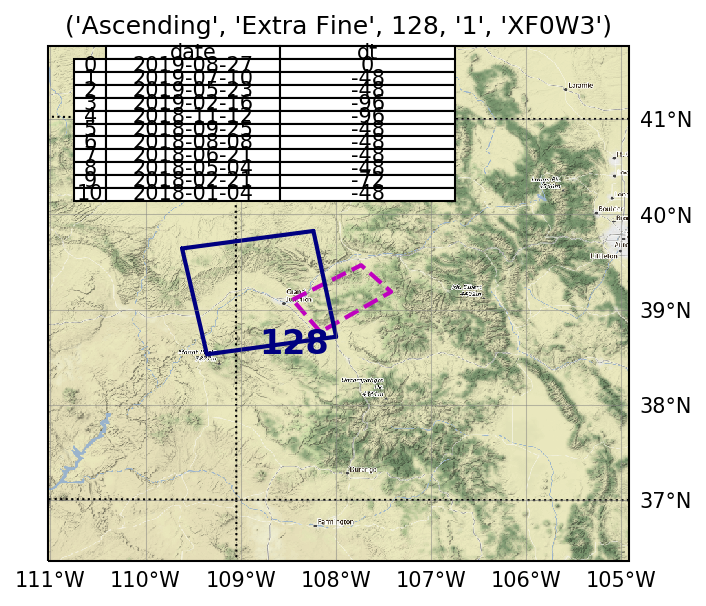

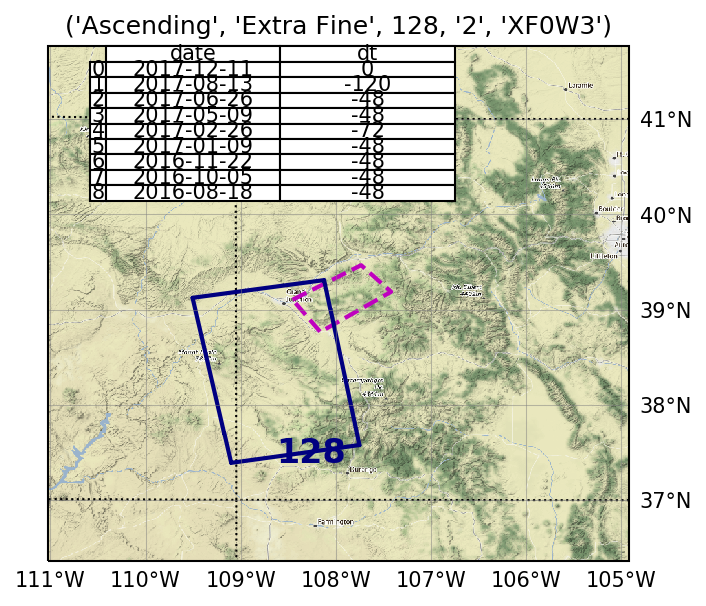

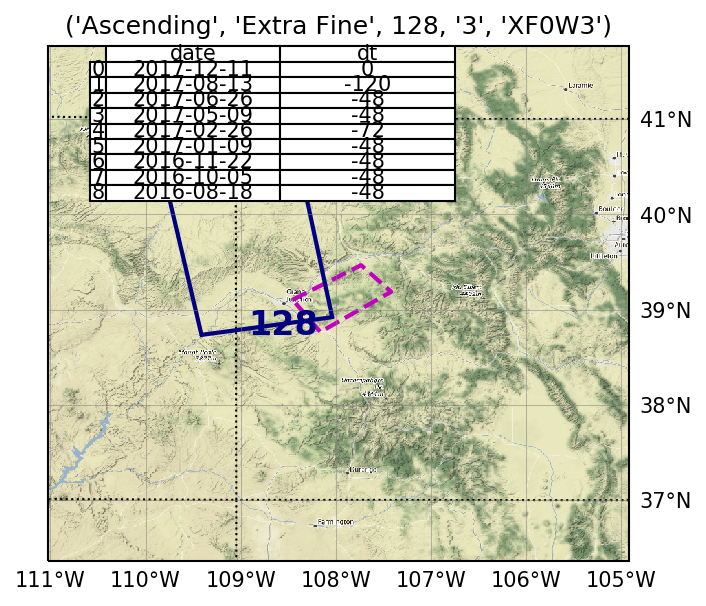

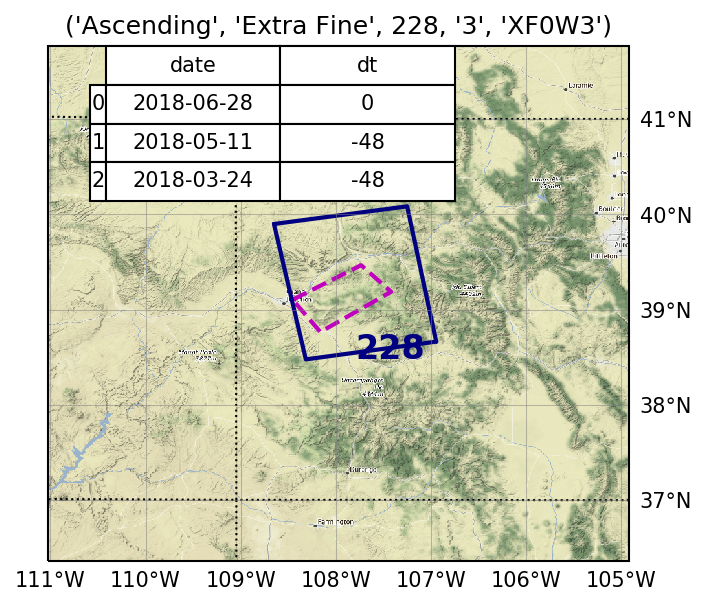

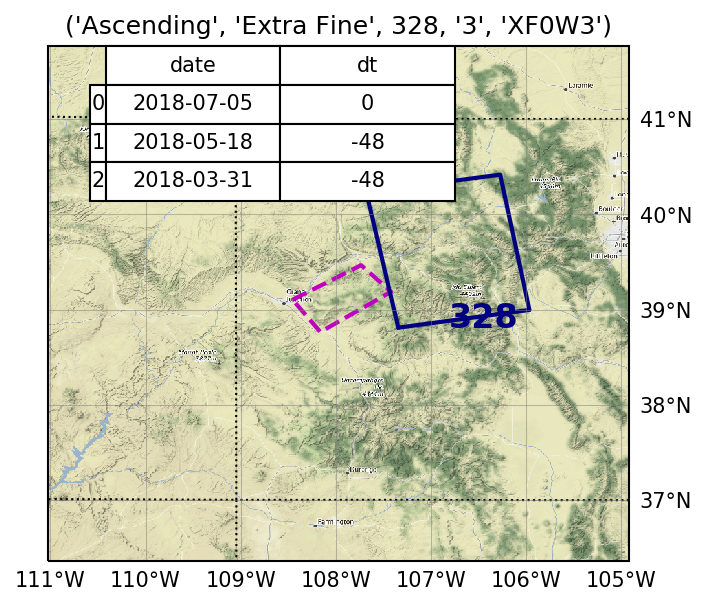

...

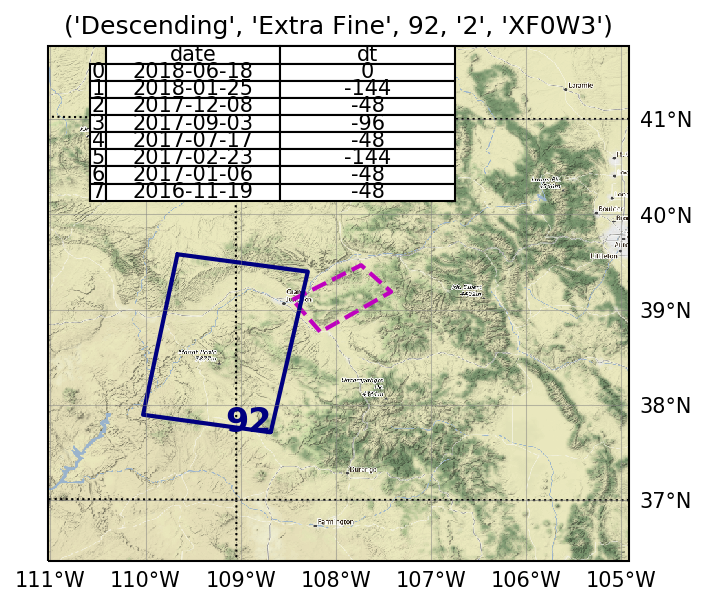

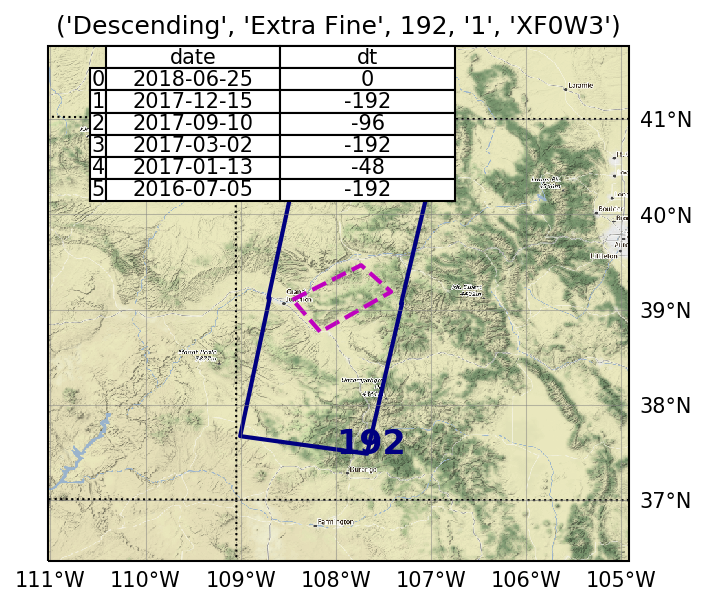

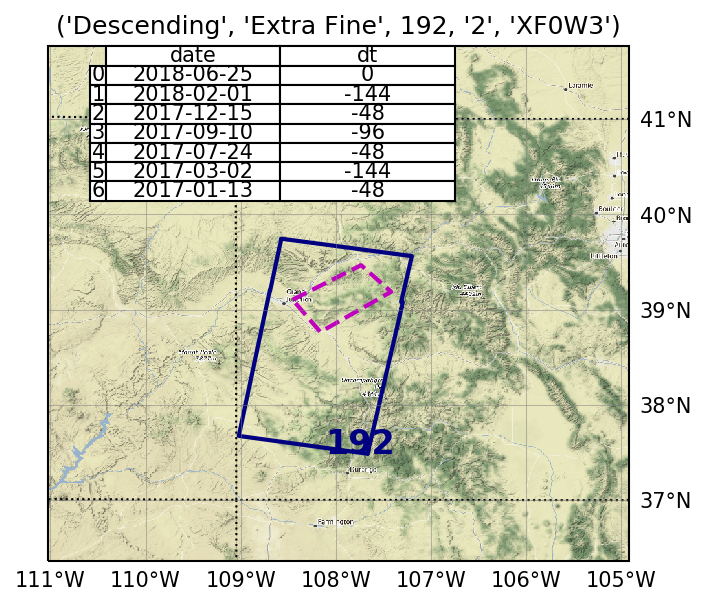

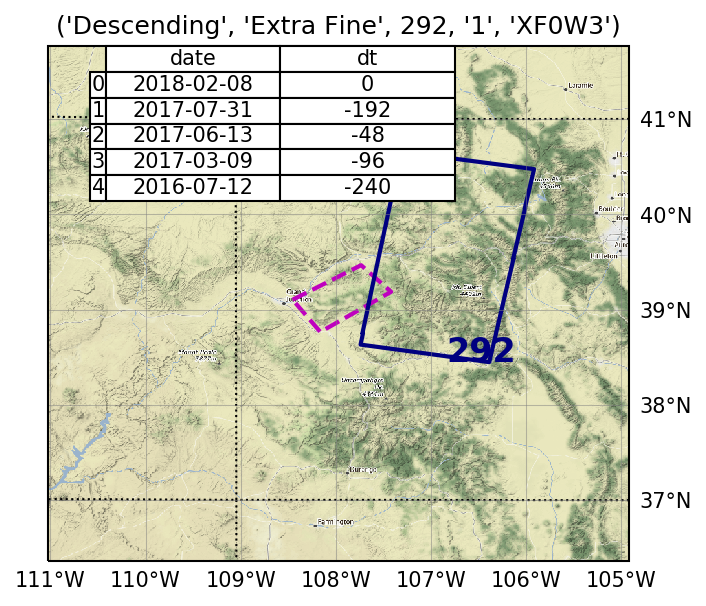

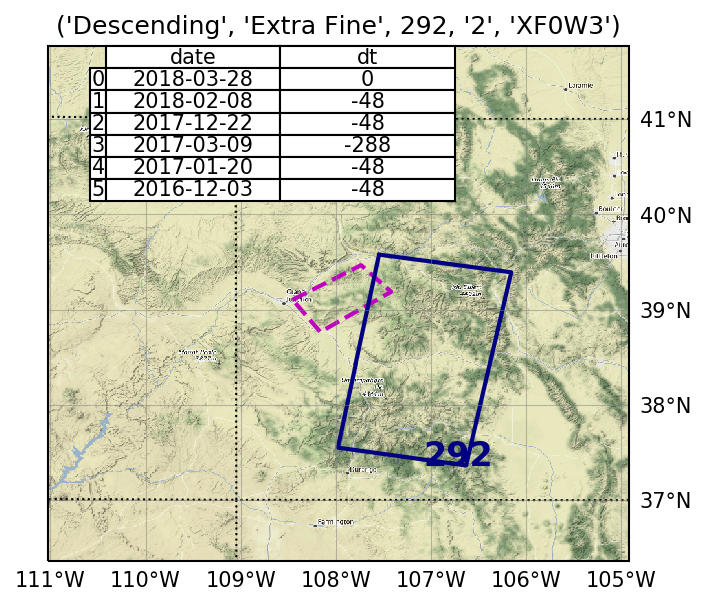

In [56]:
# Print maps for all combinations of possible interferometric pairs!
for labels, indices in GB.groups.items():
    #print(labels, indices)
    #print(labels, DF.loc[indices, "Scene ID"].tolist())
    inventory = GF.loc[indices]
    tmp = print_dates(inventory)
    plot_map(inventory, snwe, vectorFile, title=str(labels), tableFrame=tmp)

In [57]:
def print_inventory(GF):
    ''' print list of dates from dataframe'''
    tmp = GF.loc[:, ['sceneId','sceneDate']].reset_index(drop=True)
    tmp.loc[:, 'timeStamp'] = pd.to_datetime(tmp.sceneDate)
    tmp['date'] = tmp.sceneDate.str[:10]
    timeDeltas = tmp.timeStamp.diff()
    tmp['dt'] = timeDeltas.dt.days
    tmp.loc[0, 'dt'] = 0
    tmp['dt'] = tmp.dt.astype('i2')
    return tmp.loc[:, ['sceneId','date','dt']]

## Best candidate time series 
Preference for:
- Looking for good spatial coverage of grand mesa 
- 24 or 48 pairs for possible time series analysis
- Unclear if Ascending 128 frames 1,2,3 can be combined (only get end of Mesa). But this is the only track with acquisitions in the last year!

In [58]:
#Descending Extra Fine 192 2 XF0W3
#Descending Extra Fine 192 1 XF0W3
#Ascending Extra Fine 228 3 XF0W3
GB = GF[GF.relativeOrbit.isin([192,228])].groupby(order)["sceneId"]
for labels, indices in GB.groups.items():
    print(labels)
    inventory = GF.loc[indices]
    tmp = print_inventory(inventory)
    print(tmp)

('Ascending', 'Extra Fine', 228, '3', 'XF0W3')
  sceneId        date  dt
0  647637  2018-06-28   0
1  636323  2018-05-11 -48
2  625753  2018-03-24 -48
('Descending', 'Extra Fine', 192, '1', 'XF0W3')
  sceneId        date   dt
0  647075  2018-06-25    0
1  605290  2017-12-15 -192
2  586048  2017-09-10  -96
3  542487  2017-03-02 -192
4  531982  2017-01-13  -48
5  489368  2016-07-05 -192
('Descending', 'Extra Fine', 192, '2', 'XF0W3')
  sceneId        date   dt
0  647075  2018-06-25    0
1  615409  2018-02-01 -144
2  605290  2017-12-15  -48
3  586048  2017-09-10  -96
4  575190  2017-07-24  -48
5  542487  2017-03-02 -144
6  531982  2017-01-13  -48


In [165]:
# Forecast future acquisitions by printing 24-day increments
def forecast(date, nperiods=50, ndays='24D', start='2019-09-15', end='2020-06-01'):
    index = pd.date_range(date, periods=nperiods, freq=ndays)
    # filter to w/n time range of interest
    index = index[(index < end) & (index > start)]
    print('\n'.join([x.strftime('%Y-%m-%d') for x in index.date]))

In [170]:
print('forecast for upcoming acquisitions of 228:')
forecast('2018-06-28')

forecast for upcoming acquisitions of 228:
2019-09-27
2019-10-21
2019-11-14
2019-12-08
2020-01-01
2020-01-25
2020-02-18
2020-03-13
2020-04-06
2020-04-30
2020-05-24


In [169]:
print('forecast for upcoming acquisitions of 192:')
forecast('2018-06-25')

forecast for upcoming acquisitions of 192:
2019-09-24
2019-10-18
2019-11-11
2019-12-05
2019-12-29
2020-01-22
2020-02-15
2020-03-10
2020-04-03
2020-04-27
2020-05-21
